# Introduction to Neural Networks
### 5/8/23

## Part 1

In [2]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

In [3]:
# given data
X_raw = np.arange(0, 31)
Y_raw = np.array([30, 35, 33, 32, 34, 37, 39, 38, 36, 36, 37, 39, 42, 45, 45, 41, 40, 39, 42, 44, 47, 49, 50, 49, 46, 48, 50, 53, 55, 54, 53])

# Data to tensors
X = torch.Tensor(X_raw.reshape(-1, 1))
Y = torch.Tensor(Y_raw.reshape(-1, 1))

dataset = TensorDataset(X, Y)

### Problem 1i

In [4]:
# hyperparameters
learning_rate = .0005
num_epochs = 1000

In [5]:
# Define the neural network architecture
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(1, 3)
        self.fc2 = nn.Linear(3, 2)
        self.fc3 = nn.Linear(2, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

In [6]:
# Initialize the network and define the loss function and optimizer
net = Net()

# Loss function and optimization
criterion = nn.MSELoss()
optimizer = optim.SGD(net.parameters(), lr=learning_rate)

In [7]:
# Train the network
for epoch in range(num_epochs):
    # Forward pass
    outputs = net(X)
    loss = criterion(outputs, Y)

    # Backward and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    # print loss every 50 epochs
    if (epoch+1) % 100 == 0:
      print ('Epoch [{}/{}], Loss: {:.4f}'.format(epoch+1, num_epochs, loss.item()))

Epoch [100/1000], Loss: 292.1619
Epoch [200/1000], Loss: 122.9426
Epoch [300/1000], Loss: 199.0020
Epoch [400/1000], Loss: 175.4856
Epoch [500/1000], Loss: 144.8939
Epoch [600/1000], Loss: 164.5882
Epoch [700/1000], Loss: 119.8296
Epoch [800/1000], Loss: 82.0596
Epoch [900/1000], Loss: 59.7308
Epoch [1000/1000], Loss: 45.8013


In [8]:
# Test the model
with torch.no_grad():
    y_pred = net(X)
    print('Predicted Y: ', y_pred.numpy().flatten())

Predicted Y:  [33.17927  34.110886 35.042507 35.97412  36.905735 37.837357 38.76897
 39.700584 40.62548  41.545757 42.46603  43.386303 44.306583 45.226856
 46.14713  47.067406 47.987682 48.907955 49.82823  50.74851  51.668785
 52.589058 53.509335 54.429615 55.349884 56.270157 57.190437 58.110718
 59.030987 59.951263 60.871536]


### Problem 1ii

In [9]:
print(X.shape, Y.shape)

torch.Size([31, 1]) torch.Size([31, 1])


In [10]:
# Load the MNIST dataset and apply transformations
# Data to tensors
X_train = torch.Tensor(X_raw[:20].reshape(-1, 1))
Y_train = torch.Tensor(Y_raw[:20].reshape(-1, 1))
train_dataset = TensorDataset(X_train, Y_train)

X_test = torch.Tensor(X_raw[-10:].reshape(-1, 1))
Y_test = torch.Tensor(Y_raw[-10:].reshape(-1, 1))
test_dataset = TensorDataset(X_test, Y_test)

print(X_train.shape, Y_train.shape)
print(X_test.shape, Y_test.shape)


# Create data loaders
train_loader = DataLoader(dataset=train_dataset, shuffle=True)
test_loader = DataLoader(dataset=test_dataset, shuffle=False)


torch.Size([20, 1]) torch.Size([20, 1])
torch.Size([10, 1]) torch.Size([10, 1])


In [11]:
# Train the network
for epoch in range(num_epochs):
  for i, (inp, lbl) in enumerate(train_loader):
    # Forward pass
    outputs = net(inp)
    loss = criterion(outputs, lbl)

    # Backward and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    # print loss every 100 epochs
  if (epoch+1) % 100 == 0:
    print ('Epoch [{}/{}], Loss: {:.4f}'.format(epoch+1, num_epochs, loss.item()))

Epoch [100/1000], Loss: 6.1781
Epoch [200/1000], Loss: 1.2824
Epoch [300/1000], Loss: 6.0643
Epoch [400/1000], Loss: 5.7211
Epoch [500/1000], Loss: 44.5242
Epoch [600/1000], Loss: 0.8790
Epoch [700/1000], Loss: 0.2357
Epoch [800/1000], Loss: 0.0001
Epoch [900/1000], Loss: 15.3755
Epoch [1000/1000], Loss: 7.8360


In [12]:
# Compute the least square error on the test data
y_pred = net(X_test)
test_error = (((Y_test - y_pred)**2).mean())**1/2
print('Test error: {:.4f}'.format(test_error))

Test error: 28.9862


### Problem 1iii

In [13]:
# Load the MNIST dataset and apply transformations
# Data to tensors
X_train = torch.Tensor(np.concatenate((X_raw[:10], X_raw[-10:])).reshape(-1, 1))
Y_train = torch.Tensor(np.concatenate((Y_raw[:10], Y_raw[-10:])).reshape(-1, 1))
train_dataset = TensorDataset(X_train, Y_train)

X_test = torch.Tensor(X_raw[10:21].reshape(-1, 1))
Y_test = torch.Tensor(Y_raw[10:21].reshape(-1, 1))
test_dataset = TensorDataset(X_test, Y_test)

print(X_train.shape, Y_train.shape)
print(X_test.shape, Y_test.shape)


# Create data loaders
train_loader = DataLoader(dataset=train_dataset, shuffle=True)
test_loader = DataLoader(dataset=test_dataset, shuffle=False)

torch.Size([20, 1]) torch.Size([20, 1])
torch.Size([11, 1]) torch.Size([11, 1])


In [14]:
# Train the network
for epoch in range(num_epochs):
  for i, (inp, lbl) in enumerate(train_loader):
    # Forward pass
    outputs = net(inp)
    loss = criterion(outputs, lbl)

    # Backward and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    # print loss every 50 epochs
  if (epoch+1) % 100 == 0:
    print ('Epoch [{}/{}], Loss: {:.4f}'.format(epoch+1, num_epochs, loss.item()))

Epoch [100/1000], Loss: 185.4745
Epoch [200/1000], Loss: 61.3059
Epoch [300/1000], Loss: 14.2544
Epoch [400/1000], Loss: 11.0838
Epoch [500/1000], Loss: 0.0008
Epoch [600/1000], Loss: 0.6088
Epoch [700/1000], Loss: 22.1057
Epoch [800/1000], Loss: 16.0067
Epoch [900/1000], Loss: 4.2800
Epoch [1000/1000], Loss: 0.2705


In [15]:
# Compute the least square error on the test data
y_pred = net(X_test)
test_error = (((Y_test - y_pred)**2).mean())**1/2
print('Test error: {:.4f}'.format(test_error))

Test error: 9.6754


### Problem 1iv

The objective for this problem was to compare the results of the neural networks to the results of homework 1, which only used curve fitting tools for building the model.

Similar to the results of homework 1, using the first 10 and last 10 data points as training dataset had greater accuracy than using the first 20 data points.

Comparing classification methods, using the neural network had a greater least square error than the Line and Parabola fit, meaning that the prediction for y were worse than with the classification methods in homework 1. Only the 19th degree polynomial had a greater least square error, however this is due to the polynomial's extreme overfitting on the training data.

### Problem 2i

In [16]:
import torchvision.datasets as datasets
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import torchvision
import torchvision.transforms as transforms

In [17]:
# Load the MNIST data
mnist = fetch_openml('mnist_784', parser="auto")
y = mnist.target
X = mnist.data / 255.0  # Scale the data to [0, 1]

In [18]:
print(X.shape)

(70000, 784)


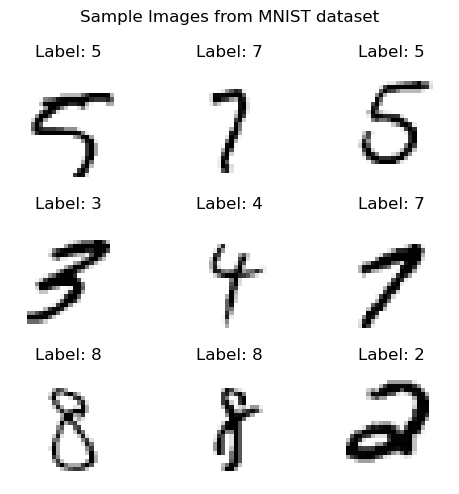

In [19]:
import random
# view random sample images in grayscale
fig = plt.figure(figsize=(5,5))
for i in range(9):
    ax = fig.add_subplot(3, 3, i+1)
    image_sel = random.randrange(0, X.shape[1])
    ax.imshow(X.to_numpy().T[:, image_sel].reshape(28, 28), cmap="binary")
    plt.title("Label: " + str(y[image_sel]))
    plt.axis('off')
plt.suptitle("Sample Images from MNIST dataset")
plt.tight_layout()

In [20]:
# Apply PCA to reduce the dimensionality of the data
pca = PCA(n_components=20)
X_pca = pca.fit_transform(X)

print(X_pca)

[[ 0.47943238 -1.24013274 -0.20051704 ...  1.15310396  1.08580133
   0.56327735]
 [ 3.96272159 -1.13711228  2.25929695 ...  0.14728163  0.25291293
  -0.49543017]
 [-0.23135665  1.54391151 -0.63528714 ... -0.47388488 -0.07989584
  -1.71755187]
 ...
 [-1.06473338  2.31403334  1.33870126 ...  0.15059082  0.33464911
  -0.31624101]
 [-1.21656792 -0.45775357  2.49301962 ...  0.36878157 -1.13324635
  -0.84076548]
 [ 4.15240049 -0.32702954  2.86800854 ... -1.21756808 -0.02088138
   0.6154273 ]]


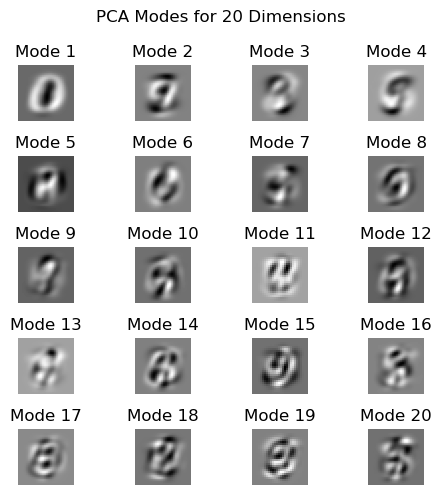

In [21]:
# Plot the 20 principal components
fig, axs = plt.subplots(nrows=5, ncols=4, figsize=(5, 5))
axs = axs.ravel()

for i in range(20):
    axs[i].imshow(pca.components_[i].reshape(28, 28), cmap='gray')
    axs[i].axis('off')
    axs[i].set_title(f'Mode {i+1}')

plt.suptitle("PCA Modes for 20 Dimensions")
plt.tight_layout()
plt.show()

### Problem 2ii

In [22]:
# hyperparameters
learning_rate = .01
num_epochs = 5
batch_size = 64

In [23]:
# Define the neural network architecture
class Net_FF(nn.Module):
    def __init__(self):
        super(Net_FF, self).__init__()
        self.fc1 = nn.Linear(784, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 10)

    def forward(self, x):
        x = x.view(-1, 784) # flatten the input image
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

In [24]:
# Load the MNIST dataset and apply transformations
train_dataset = datasets.MNIST(root='./data', train=True, transform=transforms.ToTensor(), download=True)
test_dataset = datasets.MNIST(root='./data', train=False, transform=transforms.ToTensor())

# Create data loaders
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

In [25]:
# Initialize the network and define the loss function and optimizer
net = Net_FF()
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(net.parameters(), lr=learning_rate)

In [26]:
# Train the network
for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):
        optimizer.zero_grad()
        outputs = net(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        if (i+1) % 100 == 0:
            print ('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}'.format(epoch+1, num_epochs, i+1, len(train_loader), loss.item()))

Epoch [1/5], Step [100/938], Loss: 2.2822
Epoch [1/5], Step [200/938], Loss: 2.2225
Epoch [1/5], Step [300/938], Loss: 2.1485
Epoch [1/5], Step [400/938], Loss: 2.0396
Epoch [1/5], Step [500/938], Loss: 1.7959
Epoch [1/5], Step [600/938], Loss: 1.5632
Epoch [1/5], Step [700/938], Loss: 1.2514
Epoch [1/5], Step [800/938], Loss: 0.9590
Epoch [1/5], Step [900/938], Loss: 0.8913
Epoch [2/5], Step [100/938], Loss: 0.7004
Epoch [2/5], Step [200/938], Loss: 0.6584
Epoch [2/5], Step [300/938], Loss: 0.7432
Epoch [2/5], Step [400/938], Loss: 0.5027
Epoch [2/5], Step [500/938], Loss: 0.5224
Epoch [2/5], Step [600/938], Loss: 0.5027
Epoch [2/5], Step [700/938], Loss: 0.3946
Epoch [2/5], Step [800/938], Loss: 0.4138
Epoch [2/5], Step [900/938], Loss: 0.6392
Epoch [3/5], Step [100/938], Loss: 0.4415
Epoch [3/5], Step [200/938], Loss: 0.4257
Epoch [3/5], Step [300/938], Loss: 0.5623
Epoch [3/5], Step [400/938], Loss: 0.3872
Epoch [3/5], Step [500/938], Loss: 0.1957
Epoch [3/5], Step [600/938], Loss:

In [27]:
# Test the network
with torch.no_grad():
    correct = 0
    total = 0
    for data in test_loader:
      img, lbl = data
      outputs = net(img)
      _, predicted = torch.max(outputs.data, 1)
      total += lbl.size(0)
      correct += (predicted == lbl).sum().item()
        
    print('Accuracy of the network on the 10000 test images: {} %'.format(100 * correct / total))

Accuracy of the network on the 10000 test images: 91.04 %


###With PCA

In [28]:
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM

In [29]:
# Load MNIST data
X = mnist.data.astype('float32')
y = mnist.target.astype('int64')

# Normalize the data using StandardScaler
scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)

In [30]:
# Apply PCA to reduce the dimensionality of the data
pca = PCA(n_components=20)
X_pca = pca.fit_transform(X_normalized)

In [31]:
# Split the data into training and testing sets
train_size = 60000
X_train, X_test = X_pca[:train_size], X_pca[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

In [32]:
# Define and train a neural network on the normalized and PCA-transformed data
model = Sequential()
model.add(Dense(units=64, activation='relu', input_dim=20))
model.add(Dense(units=10, activation='softmax'))
model.compile(optimizer='SGD',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
model.fit(X_train, y_train, epochs=num_epochs, batch_size=batch_size, validation_split=0.1)

# Evaluate the performance of the neural network on the testing data
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test accuracy:', test_acc * 100)
  

Epoch 1/5
844/844 [==============================] - 1s 781us/step - loss: 0.6706 - accuracy: 0.7984 - val_loss: 0.3469 - val_accuracy: 0.8998
Epoch 2/5
844/844 [==============================] - 1s 621us/step - loss: 0.3765 - accuracy: 0.8868 - val_loss: 0.2810 - val_accuracy: 0.9190
Epoch 3/5
844/844 [==============================] - 1s 621us/step - loss: 0.3225 - accuracy: 0.9018 - val_loss: 0.2496 - val_accuracy: 0.9250
Epoch 4/5
844/844 [==============================] - 1s 615us/step - loss: 0.2913 - accuracy: 0.9103 - val_loss: 0.2288 - val_accuracy: 0.9325
Epoch 5/5
313/313 [==============================] - 0s 529us/step - loss: 0.2518 - accuracy: 0.9225
Test accuracy: 92.25000143051147


### LSTM

In [33]:
# Reshape the data into sequences for the LSTM layer
n_timesteps, n_features = 20, 1
X_lstm = X_pca.reshape((X_pca.shape[0], n_timesteps, n_features))

# Split the data into training and testing sets
train_size = 60000
X_train, X_test = X_lstm[:train_size], X_lstm[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Define and train a neural network with LSTM layers
model = Sequential()
model.add(LSTM(units=64, input_shape=(n_timesteps, n_features)))
model.add(Dense(units=10, activation='softmax'))
model.compile(optimizer='SGD',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
model.fit(X_train, y_train, epochs=num_epochs, batch_size=batch_size, validation_split=0.1)

# Evaluate the performance of the neural network on the testing data
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test accuracy:', test_acc * 100)


Epoch 1/5
844/844 [==============================] - 6s 5ms/step - loss: 2.2575 - accuracy: 0.2054 - val_loss: 2.1956 - val_accuracy: 0.2512
Epoch 2/5
844/844 [==============================] - 4s 4ms/step - loss: 2.1175 - accuracy: 0.2890 - val_loss: 2.0160 - val_accuracy: 0.3357
Epoch 3/5
844/844 [==============================] - 4s 5ms/step - loss: 1.9350 - accuracy: 0.3434 - val_loss: 1.8246 - val_accuracy: 0.3745
Epoch 4/5
844/844 [==============================] - 4s 5ms/step - loss: 1.7827 - accuracy: 0.3923 - val_loss: 1.6942 - val_accuracy: 0.4223
Epoch 5/5
313/313 [==============================] - 0s 2ms/step - loss: 1.5958 - accuracy: 0.4725
Test accuracy: 47.24999964237213


###Decision Tree Classifier

In [41]:
import sklearn.tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

In [35]:
# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

In [36]:
# Train decision tree classifier
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)

# Evaluate performance on test set
acc = clf.score(X_test, y_test)
print(f"Accuracy on test set: {acc*100:.2f}%")


Accuracy on test set: 84.11%


In [43]:
import graphviz
# Plot the tree structure using Graphviz
dot_data = sklearn.tree.export_graphviz(clf, out_file="tree_1.dot", class_names=mnist.target,
                                        impurity=False, proportion = True, filled=True, rounded=True, special_characters=True)


#===== Uncomment to see tree (note it is very large)
# with open("tree_1.dot") as f:
#     dot_graph = f.read()
# graphviz.Source(dot_graph)

<Figure size 2000x2000 with 0 Axes>

###SVM

In [37]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

In [38]:
# use SVC (support vector machine classifier) for classification
svm = SVC()
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)

# evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: ", accuracy * 100, "%", sep="")


Accuracy: 96.22857142857143%
